**OpenCV** is a bunch of stuff mainly dealing with processing images and videos on our computer. This is a standard library for Computer Vision. In this file, we will introduce to a OpenCV with.

### What is OpenCV?

Perhaps this is the fundamental question that comes to mind. Well, that means **Open Source Computer Vision Library** launched by some avid coders in 1999 to incorporate image processing into a wide variety of coding languages. OpenCV is not limited to Python only, it also supports C and C++.

### OpenCV with Python

We will explain all the concepts of this computer vision library with context to Machine Learning and Python. So let’s get started with some fundamentals of OpenCV with python by looking at how it works with a practical example:

In [1]:
import cv2

cap = cv2.VideoCapture(0)
while(True):
    ret, frame = cap.read()
    cv2.imshow('frame', frame)
    if cv2.waitKey(1) and 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

* The above script is to create a video capture, 
* then insert it into a loop where the frames are played and displayed one by one with `imshow`,
* then conditional checks for the exit command,`cap.release` and 
* then `cv2.destroyAllWindows` outside the loop that takes care of the final cleanup. 

The result should be a video stream with the default OpenCV user interface:

In [3]:
from IPython.display import Image

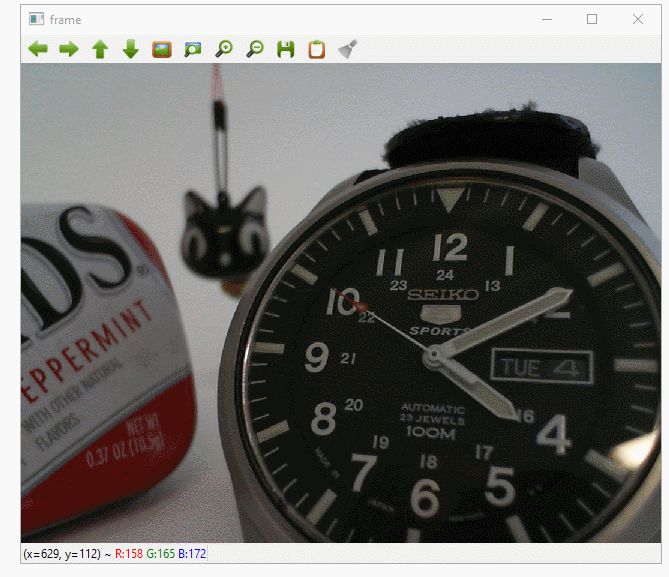

In [9]:
Image("open cv/1_ngTXrJQakf4CK6PmHE_fRg.gif")

### Colorspaces in OpenCV

There are several color spaces and transformations available, and the topic deserves its message. For now, let’s just turn the previous example into another color space:

In [2]:
import cv2

cap = cv2.VideoCapture(0)
while(True):
    ret, frame = cap.read()
    # Change colorspace:
    gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    cv2.imshow('frame', gray)
    if cv2.waitKey(1) and 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

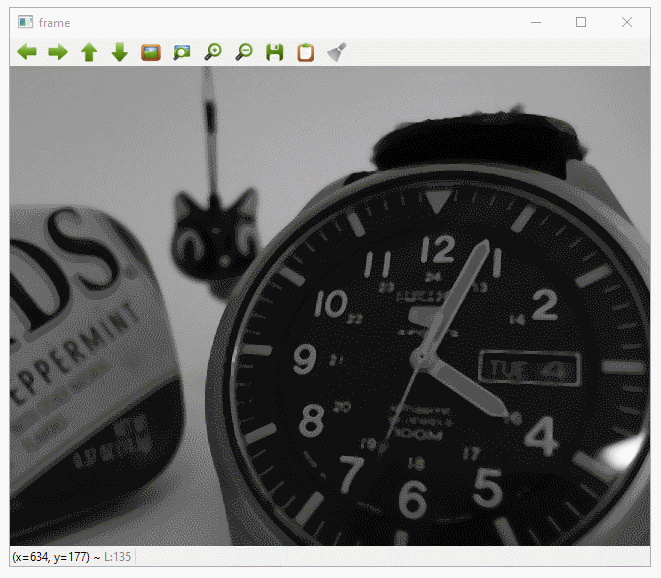

In [10]:
Image("open cv/1_aL2n1zJqOZfZYxVKvNxXNg.gif")

### Transformations in OpenCV 

We’ll find that most of the examples use a cascade (incremental steps) of transformations and operations in the main loop, so for example, here’s a more complex set:

In [8]:
import cv2

cap = cv2.VideoCapture(0)
while(True):
    ret, frame = cap.read()
    # --------CASCADE---------

    # Convert to Greyscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # Denoise (also try bluring, this is expensive )
    denoised = cv2.fastNlMeansDenoising(gray, h=3, templateWindowSize=7, searchWindowSize=21)
    # Apply threshold
    thresholded = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
    # Mirror image
    mirrored = cv2.flip(thresholded, 1)
    # --------***---------

    cv2.imshow('frame', mirrored)
    if cv2.waitKey(1) and 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

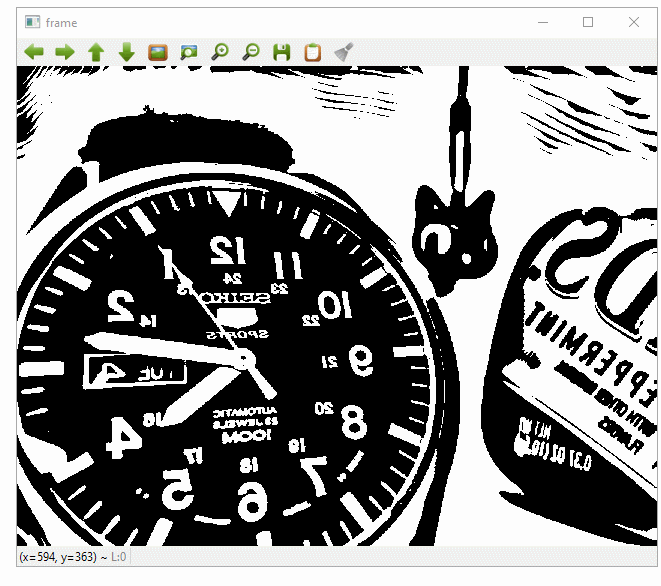

In [11]:
Image("open cv/1_9iG8v0fqP7nNa4yR9AZ-kQ.gif")

### User Interface Using OpenCV 

OpenCV also provides very simple User Interface tools that we can use to create prototypes, here is an example:

In [1]:
import cv2


# Callback function from trackbar
def onChange(x):
    # print(x)
    pass


cap = cv2.VideoCapture(0)
# Create Named window and trackbars:
cv2.namedWindow('openCV UI', cv2.WINDOW_NORMAL)
cv2.createTrackbar('Brigthness', 'openCV UI', 0, 100, onChange)
cv2.createTrackbar('Contrast', 'openCV UI', 0, 100, onChange)


while(True):
    ret, frame = cap.read()

    # Get trackbar values
    brigthness = cv2.getTrackbarPos('Brigthness', 'openCV UI')
    contrast = (cv2.getTrackbarPos('Contrast', 'openCV UI')/100)+1
    # Change brigthness & contrast
    frame = cv2.convertScaleAbs(frame, alpha=contrast, beta=brigthness)

    cv2.imshow('openCV UI', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

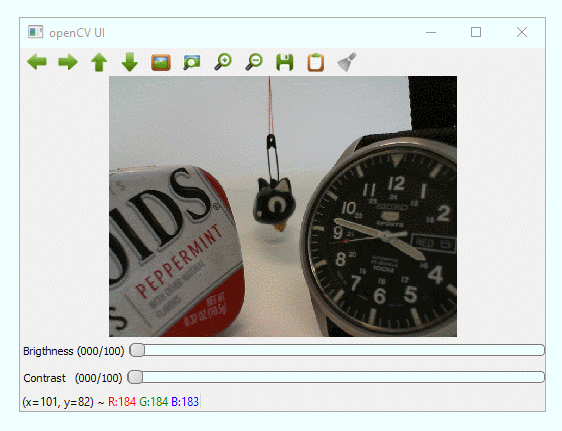

In [4]:
Image("open cv/1_XP9svRq2d0fHYqpZyxyezg.gif")

### OpenCV  for Machine Learning

Beyond basic image and video manipulation, OpenCV is a popular method for machine learning and computer vision in python, once again there is a lot to offer, like the detection of objects:

In [5]:
import cv2
import numpy as np

cap = cv2.VideoCapture(0)
while(True):
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    gray = cv2.medianBlur(gray, 5)

    # Extract regions/pixels  of interest
    rows = gray.shape[0]
    # Find circles:
    circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, rows / 8,
                               param1=100, param2=30,
                               minRadius=1, maxRadius=30)

    # Found circles ? Draw on top of them
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])
            # circle center
            cv2.circle(frame, center, 1, (0, 100, 100), 3)
            # circle outline
            radius = i[2]
            cv2.circle(frame, center, radius, (255, 0, 255), 3)

    # Display orignal frame:
    cv2.imshow('frame', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

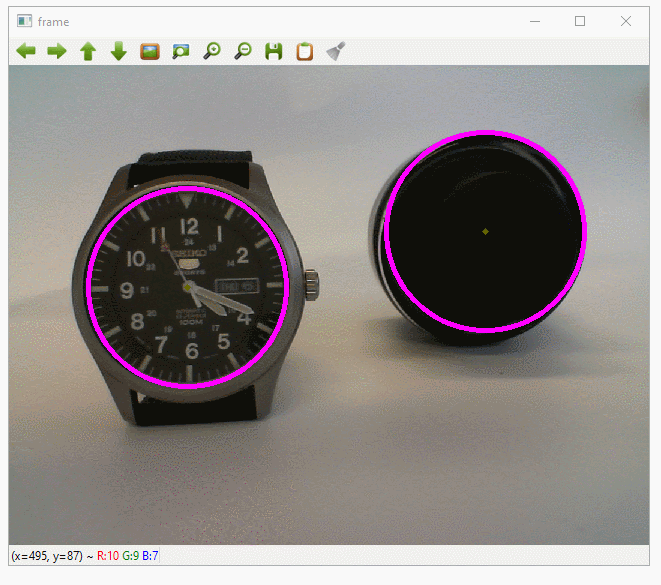

In [6]:
Image("open cv/1_5sii_x9p5Txtlr8lSpr8WQ.gif")